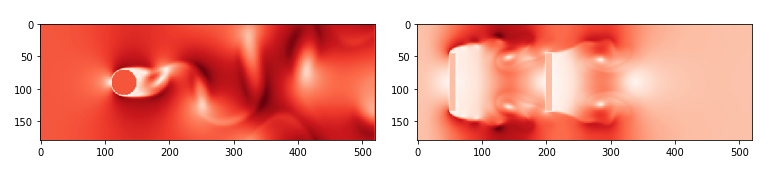

# Fluid Dynamics

* **Author:**

* **Date:**

* **Time spent on this assignment:**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.animation import FuncAnimation
import itertools
from IPython.display import HTML
import pickle
def resetMe(keepList=[]):
    ll=%who_ls
    keepList=keepList+['resetMe','np','plt','math','FuncAnimation',
                       'HTML','itertools','pickle','testFunc']
    for iiii in keepList:
        if iiii in ll:
            ll.remove(iiii)
    for iiii in ll:
        jjjj="^"+iiii+"$"
        %reset_selective -f {jjjj}
    ll=%who_ls
    return

def testFunc(func,inFiles,outFiles):
    inputs  = [pickle.load(open(f,"rb")) for f in inFiles]
    outputs = [pickle.load(open(f,"rb")) for f in outFiles]
    result  = func(*inputs)
    allGood = True
    if not isinstance(result, tuple): result = (result,)
    for i in range(len(outputs)):
        if np.max(np.abs(result[i]-outputs[i])) > 1e-14:
            print("Failed test for",outFiles[i],i,np.max(np.abs(result[i]-outputs[i])))
            allGood = False
    if allGood: print("Test Passed!")
    else:       print("Test Failed :(")

Download the test files here, or download from the website and upload & unzip them to wherever this notebook file is

In [2]:
!wget https://courses.physics.illinois.edu/phys246/fa2020/code/TestFiles.zip && unzip TestFiles.zip

zsh:1: command not found: wget


## Python Warmup

### Useful functions:

Before we begin, we want to highlight some functions that you may find useful in this assignment. The last one we'll explore in more depth as well.
* `np.zeros([dimensions])` - create an array filled with all zeros. 
    *Ex: `n = np.zeros([9,10,10])` creates a (9,10,10) array of all zeros
* `np.ones([dimensions])` - same thing as `np.zeros` but with all ones.
* `np.empty([dimensoons])` - same thing as `np,zeros` but fills array with garbage. Very fast compared to the above.
* `np.roll(x,shift,axis)` - shift array `x` by `shift` along `axis`.

### Warmup - using `np.roll`

Something we'll see later in this assignment is the need to shift elements right,left,up,down, and diagonally. Let's make a little test problem to illustrate how this works.

In [3]:
# Run me!
x = np.arange(15).reshape(3,5)
print(x)

[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]]


Now we'll want to shift every element in `x` to the right, where we wrap everything around the edge. Rather than figuring this out with a for loop, we'll employ `np.roll` to do it fast!

In [4]:
print(x,'\n')
print(np.roll(x,(0,1),(0,1)))

[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]] 

[[ 4  0  1  2  3]
 [ 9  5  6  7  8]
 [14 10 11 12 13]]


Now let's disect that command. The first `(0,1)` means don't shift the "y" direction, and to shift the "x" direction by +1. The next command `(0,1)` means to apply the shift to the two axes.  
Now let's go left:

In [5]:
print(x,'\n')
print(np.roll(x,(0,-1),(0,1)))

[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]] 

[[ 1  2  3  4  0]
 [ 6  7  8  9  5]
 [11 12 13 14 10]]


---
🦉 Now we'll try to implement a section of the Cha-Cha Slide([Lyrics](https://genius.com/Dj-casper-cha-cha-slide-lyrics))
```
♫Now it's time to get funky
To the right now, to the left
Take it back now y'all♪
```

Make your `x` array go right, then left, then "down". Your output should be:
```
[[ 4  0  1  2  3]
 [ 9  5  6  7  8]
 [14 10 11 12 13]]
[[ 1  2  3  4  0]
 [ 6  7  8  9  5]
 [11 12 13 14 10]]
[[ 5  6  7  8  9]
 [10 11 12 13 14]
 [ 0  1  2  3  4]]
```
(Notice how down isn't what you may expect...)

In [6]:
#!Start
print(np.roll(x,(0,1),(0,1)))
print(np.roll(x,(0,-1),(0,1)))
print(np.roll(x,(-1,0),(0,1)))
#!Stop

[[ 4  0  1  2  3]
 [ 9  5  6  7  8]
 [14 10 11 12 13]]
[[ 1  2  3  4  0]
 [ 6  7  8  9  5]
 [11 12 13 14 10]]
[[ 5  6  7  8  9]
 [10 11 12 13 14]
 [ 0  1  2  3  4]]


🦉In a special version of the song, the next line goes
```
♫ Take it diagonally up and to the right now y'all
```
Implement this array move, you should get:
```
[[14 10 11 12 13]
 [ 4  0  1  2  3]
 [ 9  5  6  7  8]]
 ```

In [7]:
print(np.roll(x,(1,1),(0,1))) #!#

[[14 10 11 12 13]
 [ 4  0  1  2  3]
 [ 9  5  6  7  8]]


Now you're a ~~Cha-Cha Slide~~ `np.roll` master!

## Exercise 1: Fluid Dynamics 

* **List of collaborators:**

* **References you used in developing your code:**

In this assignment you will produce a fluid dynamics simulations.  We are going to develop a number of functions which you will store in the cell below (as well as some global variables that we will use throughout this exercise). 

In [8]:
### global variables and functions  
### function-cell - put everything in here!
nx=520; ny=180 #size of our simulation
#!Start
v=np.zeros((9,2),dtype='int')
v[0,:]=[0,0]
v[1,:]=[0,1]
v[2,:]=[0,-1]
v[3,:]=[1,0]
v[4,:]=[-1,0]
v[5,:]=[-1,-1]
v[6,:]=[-1,1]
v[7,:]=[1,-1]
v[8,:]=[1,1]


def GenerateCylinderObstacle():
    obstacle=np.empty((nx,ny),dtype='bool') 
    obstacle[:,:]=False ##R
    cx = nx/4; cy=ny/2; r=ny/9;  ##R
    obstacle[:,:]=False ##R
    for x in np.arange(0,nx): ##R
        for y in np.arange(0,ny): ##R
            if (x-cx)**2+(y-cy)**2<r**2: ##R
                obstacle[x,y]=True ##R
    #obstacle[:,:]=False ##R
#    obstacle[50:60,ny//4:3*ny//4]=True ##R
#    obstacle[200:210,ny//4:3*ny//4]=True ##R
#    obstacle[50:60,85:90]=False
    return obstacle

def GenerateWallObstacle():
    obstacle=np.empty((nx,ny),dtype='bool') 
    obstacle[:,:]=False ##R
    obstacle[50:60,ny//4:3*ny//4]=True ##R
    obstacle[200:210,ny//4:3*ny//4]=True ##R
#    obstacle[50:60,85:90]=False
    return obstacle


def Macro2Equilibrium(rho,u):
    (a,b)=np.shape(rho)
    numVelocity=9
    n_eq=np.empty((numVelocity,a,b))
    t=np.array([4/9, 1/9, 1/9, 1/9, 1/9,1/36, 1/36, 1/36, 1/36])
    for i in range(0,9):
        v_dot_u=(v[i,0]*u[0]+v[i,1]*u[1])
        n_eq[i,:,:]=rho*t[i]*(1 +  3*(v_dot_u) + 9/2 * (v_dot_u**2) - 3/2 * (u[0]*u[0]+u[1]*u[1]))
    return  n_eq

def Micro2Macro(n):
    (numVelocity,nx,ny)=np.shape(n)
    rho=np.zeros((nx,ny))
    u=np.zeros((2,nx,ny))
    for i in range(0,9):
        rho=rho+n[i,:,:]
        u[0]=u[0]+n[i,:,:]*v[i][0]
        u[1]=u[1]+n[i,:,:]*v[i][1]
    u[0]=u[0]/rho
    u[1]=u[1]/rho
    return (rho,u)

def Move(n,obstacle):
    n=Bounce(n,obstacle)
    n=MoveDensity(n)
    return n

    
def Bounce(n,obstacle):
    noSlip = [v.tolist().index((-v[i]).tolist()) for i in range(9)]
    nTemp=np.empty(np.shape(n))
    for i in range(9): 
        nTemp[i][obstacle] = n[noSlip[i]][obstacle] 
    for i in range(9): 
        n[i][obstacle] = nTemp[i][obstacle]
    return n

def MoveDensity(n):
    nout=np.empty(np.shape(n))
    for i in range(9): 
        nout[i,:,:] = np.roll(n[i,:,:],v[i],axis=(0,1))
    return nout

    
def Bounce(n,obstacle):
    noSlip = [v.tolist().index((-v[i]).tolist()) for i in range(9)]
    nTemp=np.empty(np.shape(n))
    for i in range(9): 
        nTemp[i][obstacle] = n[noSlip[i]][obstacle] 
    for i in range(9): 
        n[i][obstacle] = nTemp[i][obstacle]
    return n

def Generate_n_init():
    initVelocity=np.zeros((2,nx,ny))
    uLB=0.04
    ly=ny-1.0; 
    for d in range(0,2):
        for x in range(0,nx):
            for y in range(0,ny):
                initVelocity[d,x,y]=(1-d)*uLB*(1.0+1e-4*np.sin(y/ly*2*np.pi))
    initRho=np.zeros((nx,ny))+1.0
    n_init = Macro2Equilibrium(initRho,initVelocity)
    return n_init
    

def FixBoundary(n,n_init):
    for i1 in [4,5,6]:
        n[i1,-1,:] = n[i1,-2,:] # Right wall: outflow condition.
    n[:,0,:]=n_init[:,0,:]
    return n

def Collision(n,obstacle):
    (rho,u)=Micro2Macro(n)
    neq = Macro2Equilibrium(rho,u)
    omega=1.9572953736654806
    nout = n*(1-omega) + omega*neq # Collision step.
    for i in range(0,9):
        nout[i][obstacle]=n[i][obstacle]
    n=nout.copy()     
    return n
###### Main time loop ##########################################################
def Setup():
    neq_init=Generate_n_init()
    n = neq_init.copy()
    return n # (n,neq_init)

def Run(steps,record,n,n_init,obstacle):
    us=[]
    rhos=[]
    for time in range(0,steps):
        n=FixBoundary(n,n_init)
        n=Collision(n,obstacle)
#        n=Bounce(n,obstacle)
#        n=Move(n)
#        n=Bounce(n,obstacle)
        n=Move(n,obstacle)

        if time % record ==0:
            (rho,u)=Micro2Macro(n)
            us.append(((u[0]**2+u[1]**2)**0.5).transpose())
            rhos.append(rho)
    (rho,u)=Micro2Macro(n)
    us.append(((u[0]**2+u[1]**2)**0.5).transpose())
    rhos.append(rho)
    plt.imshow(us[-1],cmap=plt.cm.Reds)
    plt.show()
    return (rhos,us,n)

def AnimateMe(us_flat,myMax):
    fig, ax = plt.subplots()
    cax = ax.imshow(us_flat[1],cmap=plt.cm.Reds,vmin=0,vmax=myMax)
    plt.close(fig)
    def animate(i):
         cax.set_array(us_flat[i])

    anim = FuncAnimation(fig, animate, interval=100, frames=len(us_flat),repeat=False)
    return anim
#!Stop


<div class="alert alert-danger" style="color:black">

If you have a function that takes in an array <code>n</code>, always make a new variable to return:
```python
def doMath(n):
    # nout = n.copy() #notice the .copy(), so that they aren't the same object
    nout = 2*n+5
    return nout
```

</div>

### a.  Making some obstacles

To simulate the real world on the computer, we'll break the tunnel into $n_x\times n_y$ squares which we'll call *voxels*.  


Your simulation will be doing fluid dynamics in a $n_x \times n_y$ "tunnel" which has some objects within it.  These objects will be represented by a boolean $n_x \times n_y$ size array `obstacle=np.empty((nx,ny),dtype='bool')` which should be `True` where the obstacle is and `False` otherwise. For example, 
```python
obstacle[:,:]=False
obstacle[50:70,50:70]=True
```
would set up a square $20 \times 20$ object inside our tunnel. 

🦉Add a `GenerateCylinderObstacle()`  function to the "function-cell" above which generates a object which is a cylinder located at $(n_x/4,n_y/2)$ with a radius of $n_y/9$

If you do `plt.matshow(GenerateCylinderObstacle())` it should look like this

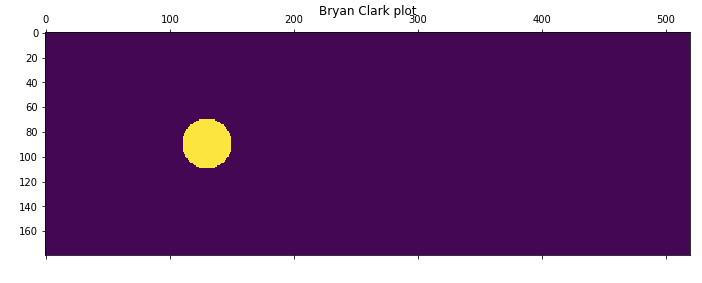


<div class="alert alert-warning" style="color:black">
<b>Do not use the word <code>object</code> as a variable!</b> <br />Notice how <code>object</code> is green in a cell - this means it is a special keyword.<br /> 
</div>

#### Test:

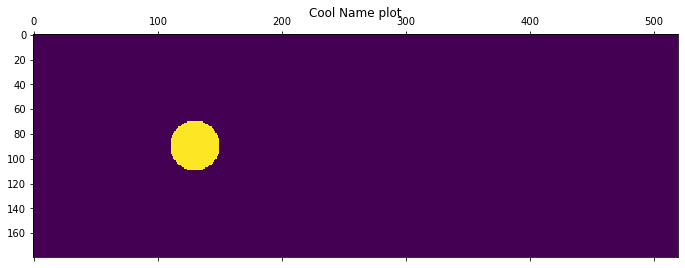

In [9]:
## Call your function here to see if if works. 
plt.matshow(GenerateCylinderObstacle().transpose())
plt.title("Cool Name plot")
#plt.savefig("images/object.png")
plt.show()
            

## b.  Microscopic velocities $v_i$

To simulate the real world on the computer, we'll break the tunnel into $n_x\times n_y$ squares which we'll call *voxels*.

The key quantity in your simulation is  nine microscopic degrees of freedom 
* $n_k(i,j)$ where $0\leq k \leq 8$ and $(i,j)$ are over the $n_x \times n_y$ voxels of your simulation

which are going to be nine different densities (for each voxel $(i,j)$) which correspond to the density of a fluid at $(i,j)$ moving in nine different directions (or velocities $v_k$):
* $n_0$: stationary fluid moving at velocity $v_0=(0,0)$
* $n_1$: fluid moving up moving at velocity $v_1=(0,1)$
* $n_2$: fluid moving down at velocity $v_2=(0,-1)$
* $n_3$: fluid moving right at velocity $v_3=(1,0)$
* $n_4$: fluid moving left at velocity $v_4=(-1,0)$
* $n_5$: fluid moving left-down at velocity $v_5=(-1,-1)$
* $n_6$: fluid moving left-up at velocity $v_6=(-1,1)$
* $n_7$: fluid moving right-down at velocity $v_7=(1,-1)$
* $n_8$: fluid moving right-up at velocity $v_8=(1,1)$
    
It will be useful to have access to these microscopic velocities as global variables.  🦉**Go ahead and add to the top of your "function-cell" the various velocities:**
```python
v=np.zeros((9,2),dtype='int')
v[0,:]=[0,0]
v[1,:]=[0,1]
...
```

**Plot these (below) as**
```python
for i in range(0,9):
    plt.arrow(0,0,v[i,0],v[i,1],head_width=0.05, head_length=0.1, fc='k', ec='k')
plt.xlim(-1.2,1.2)
plt.ylim(-1.2,1.2)
plt.show()
```
and make sure it looks like 
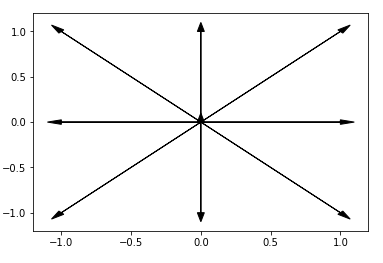

#### Test:

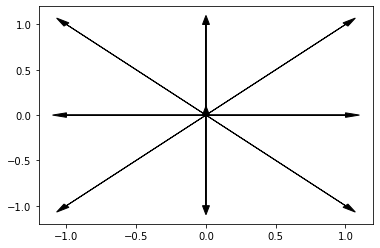

In [10]:
## Plot your microscopic velocities

for i in range(0,9):
    plt.arrow(0,0,v[i,0],v[i,1],head_width=0.05, head_length=0.1, fc='k', ec='k')
plt.xlim(-1.2,1.2)
plt.ylim(-1.2,1.2)
#plt.savefig("images/densityDirection.png")
plt.show()

We will represent the microscopic densities by a variable 
* `n=np.zeros(9,nx,ny)`


The high level algorithm for fluid dynamics is very simple.  After setting up the initial conditions, we loop many times doing
* Adjust boundary conditions
* Collide the microscopic densities
* Move the microscopic densities


### c. Computing macroscopic quantities from the microscopic density

Given the microscopic densities, there are two macroscopic quanties:
* the macroscopic density $\rho(i,j)=\sum_k n_k$ (*size: $n_x \times n_y$*)
* the macroscopic velocity $\vec{u}(i,j) \equiv (u_x(i,j),u_y(i,j)$ (*size: $2 \times n_x \times n_y$*) where
    * $u_x(i,j) = 1/\rho \sum_k v_{k,x}\, n_k(i,j)$ 
    * $u_y(i,j) = 1/\rho \sum_k v_{k,y}\, n_k(i,J)$

which you will compute using the function (you will write) `(rho,u) = Micro2Macro(n)`

🦉Go ahead and write this function and add it to your 'function-cell' 

You can test it using these lines of code:
```python
testFunc(Micro2Macro,["Microscopic.dat"],["rho_after_Micro2Macro.dat","u_after_Micro2Macro.dat"])
```
and see if it print two zeros (which is a success!)

**Tip:** Because `u` is $(2,n_x,n_y)$, we can get `ux` by doing `u[0]` (which is then a $(n_x,n_y)$ array) and `uy` by doing `u[1]`.

#### optional - `np.einsum`

Figuring out the summations effeciently can be a pain, but we can use [`np.einsum`](https://docs.scipy.org/doc/numpy/reference/generated/numpy.einsum.html) help out here. Figure out how to rewrite the above problem with einstein summation notation. To use the function, if we have 
$$
A_{ijk}\cdot B_{dk} = C_{ijd},
$$
we'd use then call:
```python
C = np.einsum("ijk,dk->ijd",A,B)
```

#### Test:

In [11]:
#!Start
#import pickle
#np.random.seed(30)
#microscopicDensity=np.random.random((9,nx,ny))
#pickle.dump( microscopicDensity, open( "Microscopic.dat", "wb" ) )
#(rho,u)=Micro2Macro(microscopicDensity)
#pickle.dump( rho, open( "rho_after_Micro2Macro.dat", "wb" ) )
#pickle.dump( u, open( "u_after_Micro2Macro.dat", "wb" ) )
#!Stop
testFunc(Micro2Macro,["Microscopic.dat"],["rho_after_Micro2Macro.dat","u_after_Micro2Macro.dat"])

FileNotFoundError: [Errno 2] No such file or directory: 'Microscopic.dat'

### d. Getting the equilibrium microscopic densities. 


Given the macroscopic densities $\rho$ and $\vec{u}$, there is a *equilibrium* microscopic densities $n_{eq}$ (*size: $9 \times n_x \times n_y$*) which you will compute using `n_eq=Macro2Equilibrium(rho,u,obstacle)`

The relevant formula for this is 

$$ n^{eq}(v_k) \equiv n_k^{eq} =  \omega_k \rho \left(1 + 3 \vec{v_k} \cdot \vec{u} + \frac{9}{2}(\vec{v_k} \cdot \vec{u})^2- \frac{3}{2}(\vec{u}\cdot \vec{u}) \right)  \tag{A} $$

where 
* $\omega_{0}=4/9$
* $\omega_{1-4}=1/9$ 
* $\omega_{5-8}=1/36$

Given some microscopic densities $n$ you should be able then to figure out the equilibrium microscopic densities $n_{eq}$.  

🦉Write the functions `Macro2Equilibrium` adding them to your "function-cell"

You can test it by checking if 
```python
testFunc(Macro2Equilibrium,["rho_after_Micro2Macro.dat","u_after_Micro2Macro.dat"],["Microscopic_after_equilibrium.dat"])
```
is equal to zero.

#### Test:

In [29]:
#pickle.dump( microscopicDensity, open( "Microscopic_after_equilibrium.dat", "wb" ) ) #!#
testFunc(Macro2Equilibrium,["rho_after_Micro2Macro.dat","u_after_Micro2Macro.dat"],["Microscopic_after_equilibrium.dat"])


Test Passed!


### d. Implementing collision

Once you can compute these quantities, the next step is to implement the collision step.  

🦉Write a function `Collision(n,obstacle)` which returns the density `n` after collision.  Put it in your function-cell above.


When we collide the microscopic densities, we get new microscopic densities given as  
* `nout = n * (1-omega) + omega * neq` 

Here are the steps for the function:
1. Calculate `neq`  
    a. take the microscopic densities $\rightarrow$ compute the macroscopic density and velocity `(rho,u) = Micro2Macro(n)`  
    b. take the macroscopic density and velocity $\rightarrow$ compute the equilibrium microscopic densities `neq=Macro2Equilibrium(rho,u)`  
2. Calculate `nout = n * (1-omega) + omega * neq`   
    a. $\omega$ is the viscosity parameter.  We will use $\omega =1.9572953736654806$
3. We moved fluid where the obstacle is, so we need to undo this. Reset all `nout` where the obstacle is to be the same as `n` 



Test with 
```python
testFunc(lambda x: Collision(x,GenerateCylinderObstacle()),["Microscopic.dat"],["Microscopic_after_collision.dat"])
```


#### Test:

In [38]:
#pickle.dump( Collision(microscopicDensity,GenerateCylinderObstacle()), open( "Microscopic_after_collision.dat", "wb" ) ) #!#

testFunc(lambda x: Collision(x,GenerateCylinderObstacle()),["Microscopic.dat"],["Microscopic_after_collision.dat"])

Test Passed!


### e. Moving

We'll now move on to getting the fluid to move. This will be a function called, surprise, `Move(n,obstacle)`. But first we need to helper functions:
* `Bounce(n,obstacle)`
    * bounce the velocities - that is every velocity where the obstacle is gets reversed
* `MoveDensity(n)`
    * Move all your densities in the direction of the velocity (*hint* the velocity tells you where to move it)
    * Assume periodic boundary conditions here

Thus a `Move(n,obstacle)` call is just a `Bounce` then `MoveDensity`. 🦉Write this function and test!


Test:
```python
testFunc(lambda x: Bounce(x,GenerateCylinderObstacle()),["Microscopic.dat"],["Microscopic_after_bounce.dat"])

testFunc(MoveDensity,["Microscopic.dat"],["Microscopic_after_moveDensity.dat"])

testFunc(lambda x: Move(x,GenerateCylinderObstacle()),["Microscopic.dat"],["Microscopic_after_move.dat"])
```

#### Tests:

In [44]:
#!Start
#pickle.dump( MoveDensity(microscopicDensity), open( "Microscopic_after_moveDensity.dat", "wb" ) )
##pickle.dump( MoveDensity(microscopicDensity,GenerateCylinderObstacle()), open( "Microscopic_after_collision.dat", "wb" ) )
##print(np.max(np.abs(Collision(microscopicDensity,GenerateCylinderObstacle())-pickle.load( open( "Microscopic_after_collision.dat", "rb" ) ))))
#microscopicDensity=pickle.load( open( "Microscopic.dat", "rb" ) )
#pickle.dump( Bounce(microscopicDensity,GenerateCylinderObstacle()), open( "Microscopic_after_bounce.dat", "wb" ))
#microscopicDensity=pickle.load( open( "Microscopic.dat", "rb" ) )
#pickle.dump( Move(microscopicDensity,GenerateCylinderObstacle()), open( "Microscopic_after_move.dat", "wb" ) )
#!Stop

testFunc(lambda x: Bounce(x,GenerateCylinderObstacle()),["Microscopic.dat"],["Microscopic_after_bounce.dat"])

Test Passed!


In [42]:
testFunc(MoveDensity,["Microscopic.dat"],["Microscopic_after_moveDensity.dat"])

Test Passed!


In [45]:
testFunc(lambda x: Move(x,GenerateCylinderObstacle()),["Microscopic.dat"],["Microscopic_after_move.dat"])

Test Passed!


### f.  Boundary conditions

In the y-direction, we are just going to assume that the boundary conditions are periodic. For the x-direction, we are going to assign certain boundary conditions on the left and right.  

Let's call this function `FixBoundary(n,n_init)` which applies these boundary conditions and returns the new density `n`.

**Left:** we are going to assume that there is a flow - this means that the microscopic densities are the same at each step.  Therefore, what we should do is simply replace the current densities on the left-most row with the initial microscopic densities (`n_init`).

**Right:** we are going to assume that the gradient is zero - i.e. the important physics has dissapeared by this point.  To do this, we will set 

```python
# loop over all microscopic velocities vL that are going left 
   nout[vL,-1,:] = nout[vL,-2,:] 
```
*Hint:* there are 3 `vL`s.


🦉Put all of this together and run the next test!

Testing:
```python
testFunc(FixBoundary,["Microscopic.dat","Microscopic2.dat"], ["Microscopic_after_boundary.dat"])
```


#### Test:

In [40]:
#!Start
#microscopicDensity2=np.random.random((9,nx,ny))
#pickle.dump(microscopicDensity2,open( "Microscopic2.dat","wb"))
#pickle.dump( FixBoundary(microscopicDensity,microscopicDensity2), open( "Microscopic_after_boundary.dat", "wb" ) )
#!Stop
testFunc(FixBoundary,["Microscopic.dat","Microscopic2.dat"], ["Microscopic_after_boundary.dat"])

Test Passed!


### g. Setting up the initial conditions

We need to generate an initial conditions. The way that we are going to do that is 
* pick some macroscopic density $\rho$ of size $(n_x,n_y)$ (uniformly equal to 1.0) and a 
* macroscopic velocity $\vec{u}(i,j)$ (sizes $(2,n_x,n_y)$)
    *  zero in the x-direction (aka 0)
    * `0.04*(1.0+1e-4*np.sin(y/(ny)*2*np.pi))` in the y-direction (aka 1). This introduces a very tiny anisotropy to the system.
* compute the equilibrium density $n_{eq}$ associated with the initial density and velocities.   
**Use (and return) this as the initial conditions**

🦉Write a function `Setup()` which returns the initial microscopic densities.  Remember to save this as you will need it to apply your boundary conditions. 

I get the following when I visualize it as `plt.matshow(Setup()[3].transpose())`

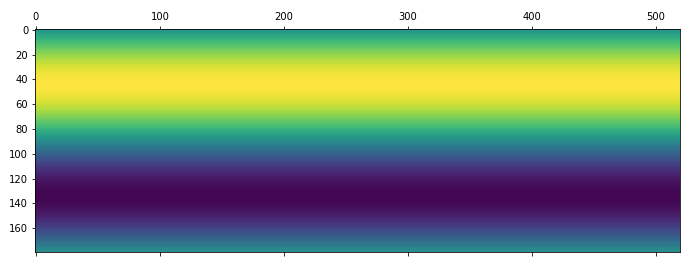

A quick test here is just to check that the following:
```python
print("All good?",(np.abs(np.max(Setup())-0.443377991)<1e-5) and ((np.abs(np.min(Setup())-0.0245774711)<1e-5)))
```

#### Test:

In [50]:
print("All good?",(np.abs(np.max(Setup())-0.443377991)<1e-5) and ((np.abs(np.min(Setup())-0.0245774711)<1e-5)))

All good? True


### h. Putting it all together

🦉Write a function `Run(steps,record,n,n_init,obstacle)` (up in your function-cell) which takes 
* the number of steps `steps` you want to run
* how often you want to `record` the velocity and density
* the microscopic densities `n` to start running from
* as well as the initial microscopic densities `n_init` for the boundary conditions (often equal to `n.copy()`) 
* and the obstacle boolean array.

Each step consists of:
1. Adjust boundary conditions
2. Collide the microscopic densities
3. Move the microscopic densities

It should return
* a list of macroscopic densities `rhos`
* a list of macroscopic velocities `us`
    * This will be `u2=`$\sqrt{\vec{u}\cdot\vec{u}}$
    * To help us later, store these as `u2.transpose()`
* the last microscopic density `n`

Now (below) call your `Setup` and `Run` functions. Then plot the final configuration (something like `plt.matshow(us[-1])`).  

🦉Run for 201 steps recording every 100 steps. 

#### Answer:

In [10]:
#!Start
fin=Setup()
feq_init=fin.copy()
obstacle=GenerateCylinderObstacle()
#!Stop

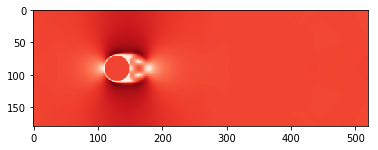

CPU times: user 2min 42s, sys: 12.7 s, total: 2min 55s
Wall time: 51.5 s


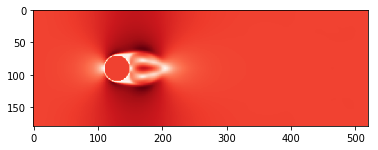

CPU times: user 2min 35s, sys: 13.5 s, total: 2min 48s
Wall time: 55.3 s


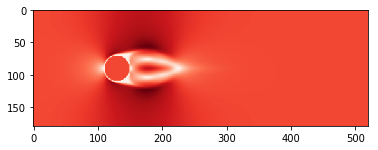

CPU times: user 2min 49s, sys: 11.7 s, total: 3min 1s
Wall time: 50.1 s


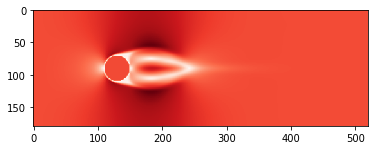

CPU times: user 2min 50s, sys: 12 s, total: 3min 2s
Wall time: 50.1 s


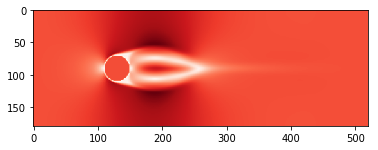

CPU times: user 2min 49s, sys: 11.2 s, total: 3min
Wall time: 49.1 s


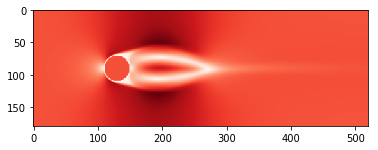

CPU times: user 2min 48s, sys: 11.3 s, total: 2min 59s
Wall time: 49.2 s


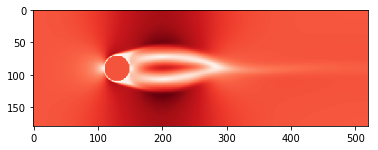

CPU times: user 2min 49s, sys: 11.6 s, total: 3min 1s
Wall time: 49.7 s


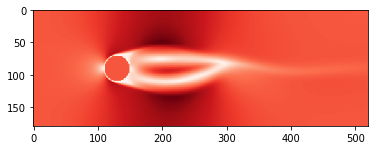

CPU times: user 2min 48s, sys: 11.5 s, total: 3min
Wall time: 49.6 s


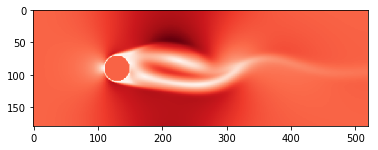

CPU times: user 2min 50s, sys: 11.3 s, total: 3min 2s
Wall time: 49.4 s


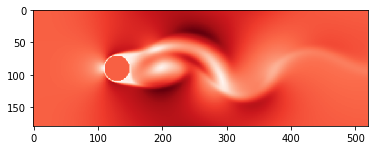

CPU times: user 2min 50s, sys: 11.6 s, total: 3min 2s
Wall time: 49.8 s


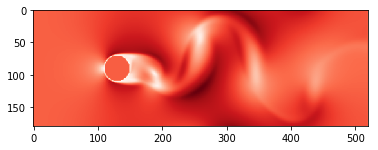

CPU times: user 2min 48s, sys: 11 s, total: 2min 59s
Wall time: 49.1 s


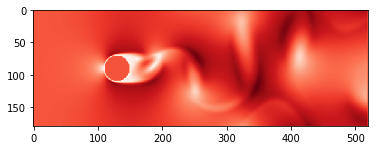

CPU times: user 2min 47s, sys: 10.3 s, total: 2min 58s
Wall time: 48.4 s


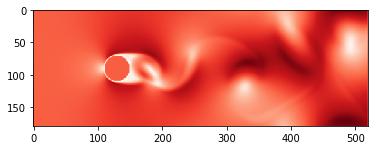

CPU times: user 2min 45s, sys: 10.9 s, total: 2min 56s
Wall time: 48.9 s


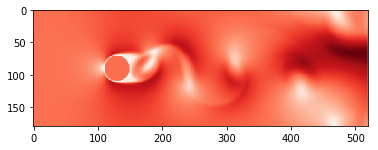

CPU times: user 2min 46s, sys: 9.67 s, total: 2min 55s
Wall time: 47.5 s


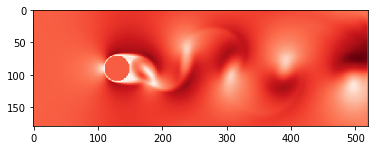

CPU times: user 2min 38s, sys: 12.6 s, total: 2min 51s
Wall time: 51.2 s


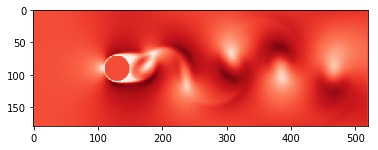

CPU times: user 2min 32s, sys: 12.4 s, total: 2min 45s
Wall time: 51.5 s


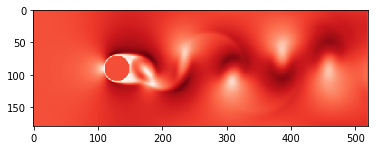

CPU times: user 2min 31s, sys: 13.2 s, total: 2min 44s
Wall time: 52.8 s


KeyboardInterrupt: 

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

In [11]:
#!Start
fins=rhos=us= [None] * 21
fins[0]=fin.copy()
for i in range(0,20):
    %time (rhos[i],us[i],fins[i+1])=Run(2000,100,fins[i],feq_init,obstacle)
#!Stop

### i. Animation

🦉Now write a function `AnimateMe(us_flat,vMax)` which is going to take a list of velocities `us_flat` (and maximum for the `vMax`) and going to return an animation which is going to be then produced by calling 
```python
anim = AnimateMe(us,vMax)
HTML(anim.to_jshtml())
```

This function will look like:
```python
def AnimateMe(us_flat,vMax):
    fig, ax = plt.subplots()
    cax = ax.imshow(us_flat[1],cmap=plt.cm.Reds,vmin=0,vmax=vMax)
    plt.close(fig)
    def animate(i):
         cax.set_array(us_flat[i])

    anim = FuncAnimation(fig, animate, interval=100, frames=len(us_flat))
    return anim
```



#### Answer:

In [23]:
#!Start
us_flat = list(itertools.chain.from_iterable(us[:-1]))
#us_flat = list(itertools.chain.from_iterable(us[0:17]))
anim=AnimateMe(us_flat,0.07)
HTML(anim.to_jshtml())
#!Stop

### j. Speed Test (EC)
*5 Points*

Our code for for `%time Run(2000,3000,Setup(),Setup(),GenerateCylinderObstacle())` takes between 45 and 60 seconds. We'll give 5 points if you can make your code faster than 40 seconds runtime (on the server). Warning: we aren't sure this is possible!

#### Answer:

## Exercise 2: Walls

* **List of collaborators:**

* **References you used in developing your code:**

In this exercise we are going to use all the same code but generate a different object.  Here generate an object which consists of two walls:
* one spans $50 \leq x \leq 60$ and $n_y/4 \leq y \leq 3n_y/4$
* the other spans $200 \leq x \leq 210$ and $n_y/4 \leq y \leq 3n_y/4$

🦉Run your code again with this new obstacle and generate a new animation. 

#### Answer:

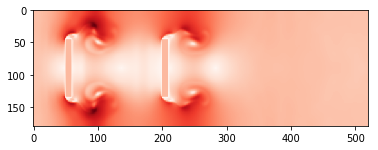

CPU times: user 2min 32s, sys: 15.5 s, total: 2min 47s
Wall time: 55.8 s


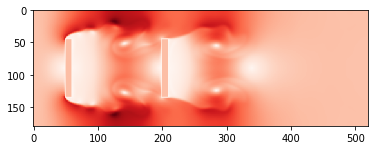

CPU times: user 2min 34s, sys: 13.4 s, total: 2min 48s
Wall time: 51.7 s


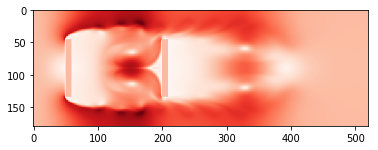

CPU times: user 2min 36s, sys: 14 s, total: 2min 50s
Wall time: 52.5 s


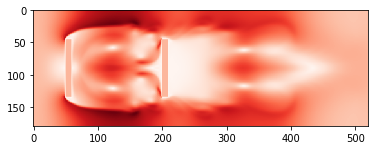

CPU times: user 2min 36s, sys: 13.7 s, total: 2min 49s
Wall time: 51.7 s


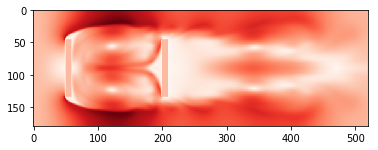

CPU times: user 2min 34s, sys: 14.1 s, total: 2min 48s
Wall time: 53.6 s


KeyboardInterrupt: 

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

TypeError: 'NoneType' object is not subscriptable

In [24]:
#!Start
fin=Setup()
feq_init=fin.copy()

obstacle=GenerateWallObstacle()
fins=rhos=us= [None] * 21
fins[0]=fin.copy()
for i in range(0,20):
    %time (rhos[i],us[i],fins[i+1])=Run(2000,100,fins[i],feq_init,obstacle)
#!Stop

In [ ]:
#!Start
us_flat = list(itertools.chain.from_iterable(us[0:-1]))
anim=AnimateMe(us_flat,0.2)
HTML(anim.to_jshtml())
#!Stop

## Exercise 3: Something new... (EC)
*(Extra credit: 5 points)*


* **List of collaborators:**

* **References you used in developing your code:**

🦉Come up with something new and cool to do with this animation code.  Maybe try out some other interesting obstacles are add some friction to the walls or such.

#### Answer:

---
**Copyright:** Byan Clark and Ryan Levy (2019)